In [1]:
import cv2
import glob
import math
import matplotlib.pyplot as plt
import numpy as np
import pickle
import skimage.feature

In [112]:
# def get_search_windows(img):
#     y_horizon = 440
#     y_bonnet = 650
    
#     window_dim_at_horizon = 64
#     window_bottom_at_horizon = y_horizon + window_dim_at_horizon / 2
    
#     window_center_at_bonnet = 480
#     window_dim_at_bonnet = (y_bonnet - window_center_at_bonnet) * 2
    
#     num_window_centers = 4
    
#     window_bottoms = np.linspace(window_bottom_at_horizon, y_bonnet, num_window_centers, dtype=np.int16)
#     window_dims = (window_dim_at_horizon +
#                    (window_dim_at_bonnet - window_dim_at_horizon) /
#                    (y_bonnet - window_bottom_at_horizon) * (window_bottoms - window_bottom_at_horizon)
#                   ).astype(np.int16)
    
#     window_x_overlap = 0.6
    
#     windows = []
#     for btm, dim in zip(window_bottoms, window_dims):
#         top = btm - dim
        
#         lefts = np.arange(0, img.shape[1], int(dim * (1 - window_x_overlap)))
        
#         for left in lefts:
#             right = left + dim
#             windows.append(((left, top), (right, btm)))
#     return windows
    
# def visualize_search_windows(img, windows):
# #     for corner0, corner1 in windows:
# #         cv2.rectangle(img, corner0, corner1, (255,0,255), 2)

#     def color_range(num):
#         colors = np.vstack((
#             np.linspace(0, 255, num),
#             np.ones(num) * 255,
#             np.ones(num) * 255)).astype(np.uint8).T
#         colors = np.array([colors])
#         colors = cv2.cvtColor(colors, cv2.COLOR_HSV2BGR)[0]
#         return colors
    
#     colors = color_range(len(windows)).astype(np.float)
    
#     for (corner0, corner1), color in zip(windows, colors):
# #         cv2.circle(img, corner0, 5, color, 3)

#         cv2.line(img, corner0, corner1, color, 3)

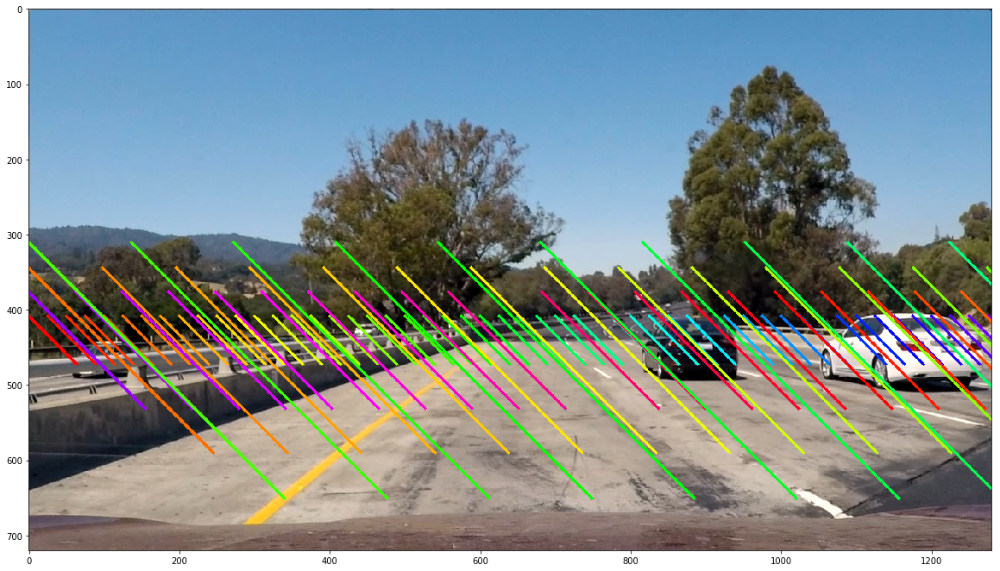

In [135]:
# img = cv2.imread('test_images/test1.jpg')
# windows = get_search_windows(img)
# visualize_search_windows(img, windows)
# plt.figure(figsize=(20, 20))
# plt.imshow(img[:,:,::-1])

### visualization helpers

In [2]:
def color_spectrum(num):
    colors = np.vstack((
        np.linspace(0, 255, num + 1)[:-1],
        np.ones(num) * 255,
        np.ones(num) * 255
    )).astype(np.uint8).T # `num` by 3 HSV colors
    colors = np.array([colors]) # 1 height by `num` width by 3 colors
    colors = cv2.cvtColor(colors, cv2.COLOR_HSV2RGB)
    colors = colors[0] # `num` by 3 colors
    return colors.astype(np.float) # cv2 color input needs to be float

### constrained areas in which to run hog

In [2]:
def get_strip_configs():
    """
    Each tuple contains (
        vertical center of strip,
        vertical height of strip
    )"""
    return [
        (440, 90),
        (470, 180),
        (500, 270)
    ]

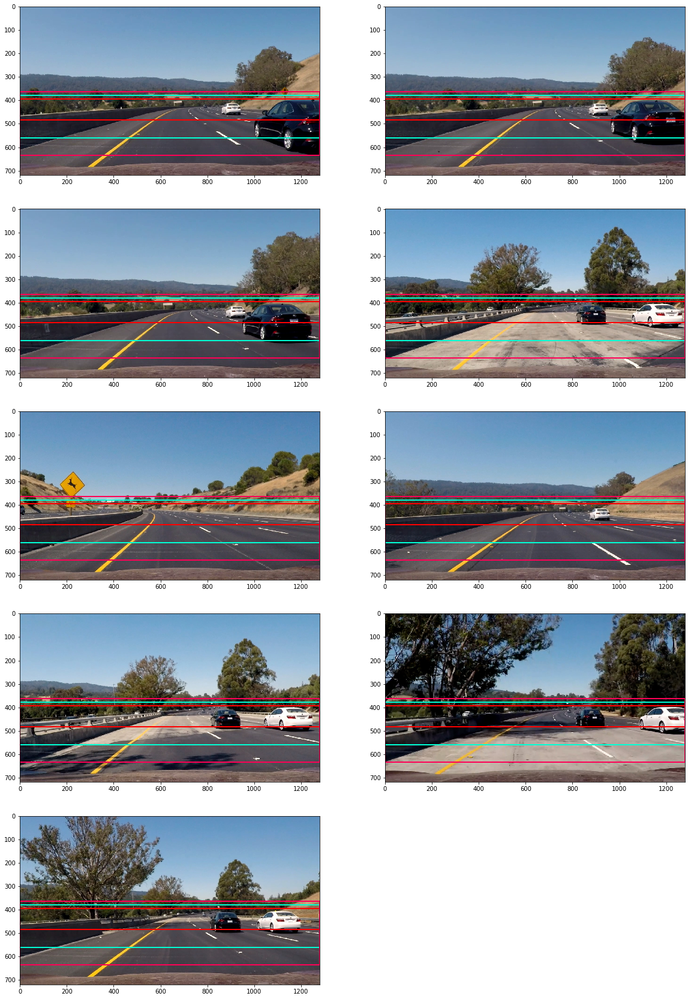

In [4]:
def visualize_strip_configs_test_images():
    def do_visualize(img):
        strip_configs = get_strip_configs()

        colors = color_spectrum(len(strip_configs))

        for (strip_y_center, strip_h), color in zip(strip_configs, colors):
            strip_y_top = int(strip_y_center - strip_h / 2)
            strip_y_btm = int(strip_y_center + strip_h / 2)
            cv2.rectangle(img, (0, strip_y_top), (img.shape[1] - 1, strip_y_btm), color, 3)
    
    img_paths = glob.glob('test_images/*')
    fig, axes = plt.subplots(ncols=2, nrows=math.ceil(len(img_paths) / 2), figsize=(20, 30))
    axes = axes.flatten()
    for ax in axes[len(img_paths):]:
        ax.remove()
    
    for img_path, ax in zip(img_paths, axes):
        img_bgr = cv2.imread(img_path)
        img_rgb = np.array(img_bgr[:,:,::-1])
        do_visualize(img_rgb)
        ax.imshow(img_rgb)

visualize_strip_configs_test_images()

### predict

In [5]:
# with open('working_dir/training_result.p', 'rb') as f:
#     TRAINING_RESULT = pickle.load(f)

# TRAINING_RESULT

/usr/local/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/sklearn/base.py:311: UserWarning: Trying to unpickle estimator StandardScaler from version 0.18.1 when using version 0.19.1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)
/usr/local/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/sklearn/base.py:311: UserWarning: Trying to unpickle estimator LinearSVC from version 0.18.1 when using version 0.19.1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


{'X_scaler': StandardScaler(copy=True, with_mean=True, with_std=True),
 'clf': LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
      intercept_scaling=1, loss='squared_hinge', max_iter=1000,
      multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
      verbose=0),
 'hog_config': {'cells_per_block': 2, 'orientations': 9, 'pixels_per_cell': 8}}

In [10]:
# # copy and paste from the training notebook.
# def get_hog_features_from_image(img_rgb, hog_config):
#     assert img_rgb.shape[0] == 64, 'image from which hog features are extracted must have height of 64'
    
#     img_luv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LUV)
#     img_lch = img_luv[:,:,0]
    
#     return skimage.feature.hog(
#         img_lch,
#         orientations=hog_config['orientations'],
#         pixels_per_cell=(hog_config['pixels_per_cell'], hog_config['pixels_per_cell']),
#         cells_per_block=(hog_config['cells_per_block'], hog_config['cells_per_block']),
#         transform_sqrt=True,
#         visualise=False,
#         feature_vector=False,
#         block_norm='L2-Hys')

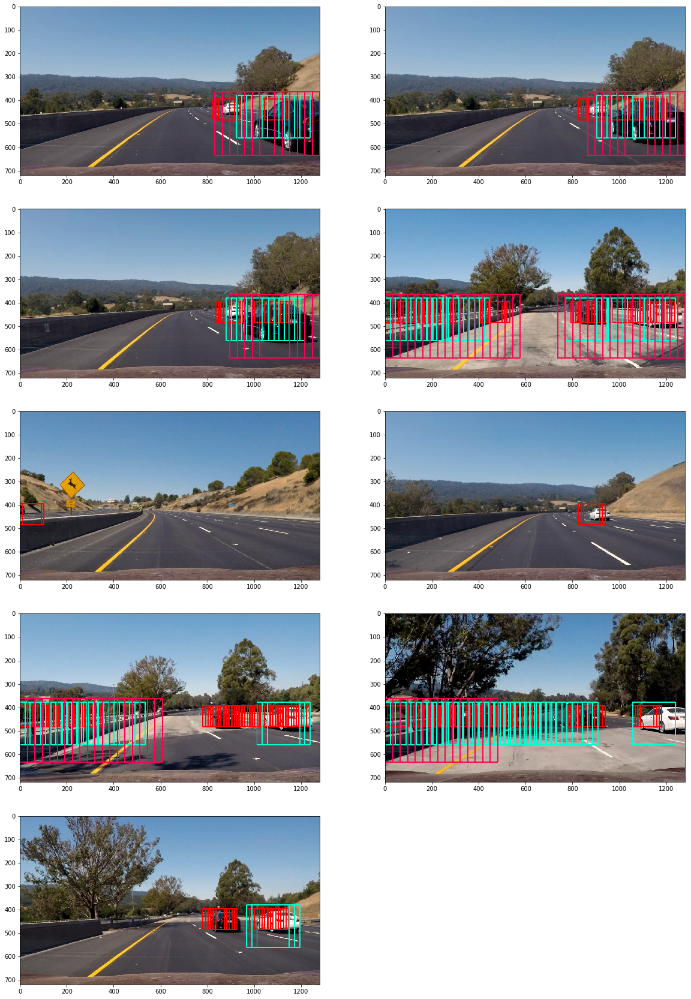

In [229]:
# def image_to_hog_features(img_rgb):
#     img_hls = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HLS)
#     img_lch = img_hls[:,:,1]
#     img_sch = img_hls[:,:,2]
    
#     hog_lch, hog_sch = [
#         skimage.feature.hog(
#             ch,
#             orientations=9,
#             pixels_per_cell=(8, 8),
#             cells_per_block=(2, 2),
#             transform_sqrt=True,
#             visualise=False,
#             feature_vector=False, # Do NOT flatten features.
#             block_norm='L2-Hys')
#         for ch in [img_lch, img_sch]]
    
#     return (hog_lch, hog_sch)
    
# def search(img_rgb):
#     hog_constraints = get_hog_constraints()

#     colors = color_spectrum(len(hog_constraints))
    
#     for (hog_y_center, hog_h), color in zip(hog_constraints, colors):
#         hog_top = int(hog_y_center - hog_h / 2)
#         hog_btm = int(hog_y_center + hog_h / 2)
        
#         # Force w to be a mult of 64, s.t. the right-most window touches the right edge.
#         # This skews a bit horizontally, but with the original w of 1280, it shouldn't matter too much.
#         hog_input_w = round(img_rgb.shape[1] / (hog_btm - hog_top)) * 64
#         hog_input_img = cv2.resize(img_rgb[hog_top:hog_btm, :, :], (hog_input_w, 64))
        
#         hog_lch, hog_sch = image_to_hog_features(hog_input_img)
        
#         num_blocks_per_window = hog_lch.shape[0]
#         num_windows = hog_lch.shape[1] - num_blocks_per_window + 1
#         num_cells_x = hog_lch.shape[1] + hog_lch.shape[3] - 1
#         cell_w = int(img_rgb.shape[1] / num_cells_x)
#         window_w = int(img_rgb.shape[1] / num_cells_x * 8)
        
#         for block_ind_x in range(num_windows):
#             window_features = np.concatenate((
#                 hog_lch[:, block_ind_x : block_ind_x + num_blocks_per_window].flatten(),
#                 hog_sch[:, block_ind_x : block_ind_x + num_blocks_per_window].flatten()
#             ))
#             predicted = TRAINING_RESULT['clf'].predict([window_features])
            
#             if predicted == 1:
#                 x0 = cell_w * block_ind_x
#                 x1 = x0 + window_w
#                 cv2.rectangle(img_rgb, (x0, hog_top), (x1, hog_btm), color, 3)

# def search_test_images():
#     img_paths = glob.glob('test_images/*')
#     fig, axes = plt.subplots(ncols=2, nrows=math.ceil(len(img_paths) / 2), figsize=(20, 30))
#     axes = axes.flatten()
#     for ax in axes[len(img_paths):]:
#         ax.remove()
    
#     for img_path, ax in zip(img_paths, axes):
#         img_bgr = cv2.imread(img_path)
#         img_rgb = np.array(img_bgr[:,:,::-1])
#         search(img_rgb)
#         ax.imshow(img_rgb)

# search_test_images()

### predict

In [3]:
with open('working_dir/overall_training_result.p', 'rb') as f:
    TRAINING_RESULT = pickle.load(f)

_, X_SCALER, _, CLF = TRAINING_RESULT['clr_hsv_results']
print(X_SCALER, CLF)

StandardScaler(copy=True, with_mean=True, with_std=True) LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
     verbose=0)


/usr/local/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/sklearn/base.py:311: UserWarning: Trying to unpickle estimator StandardScaler from version 0.18.1 when using version 0.19.1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)
/usr/local/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/sklearn/base.py:311: UserWarning: Trying to unpickle estimator SVC from version 0.18.1 when using version 0.19.1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)
/usr/local/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/sklearn/base.py:311: UserWarning: Trying to unpickle estimator RandomizedSearchCV from version 0.18.1 when using version 0.19.1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)
/usr/local/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/sklearn/base.py:311: UserWarning: Trying to unpickle estimator LinearSVC from version 0.18.1 when 

In [4]:
# Code in this box is reconstructed from the training notebook.

pixels_per_cell = 8
cells_per_block = 2
orientations = 9

pixels_per_block = pixels_per_cell * cells_per_block

cells_per_window = 8
blocks_per_window = cells_per_window - cells_per_block + 1
pixels_per_window = cells_per_window * pixels_per_cell

cells_per_step = 2

def get_window_features_in_strip(strip_hsv, verbose=False):
    def get_hog(strip_hsv):
        def hog_helper(img_single_ch):
            return skimage.feature.hog(
                img_single_ch,
                orientations=orientations,
                pixels_per_cell=(pixels_per_cell, pixels_per_cell),
                cells_per_block=(cells_per_block, cells_per_block),
                transform_sqrt=True,
                visualise=False,
                feature_vector=False,
                block_norm='L2-Hys')
        
        if (strip_hsv.shape[0] != pixels_per_window or
            strip_hsv.shape[1] % pixels_per_block != 0):
            
            w = round((strip_hsv.shape[1] / strip_hsv.shape[0] * pixels_per_window) / pixels_per_block) * pixels_per_block
            strip_hsv = cv2.resize(strip_hsv, (w, pixels_per_window))
        
        if verbose:
            print('for hog, strip is resized to', strip_hsv.shape)
        
        strip_sch = strip_hsv[:,:,1]
        strip_vch = strip_hsv[:,:,2]
        hog_sch = hog_helper(strip_sch)
        hog_vch = hog_helper(strip_vch)
        whole_hog = np.stack((hog_sch, hog_vch), axis=-1)
        
        if verbose:
            print('num hog block in x dir', whole_hog.shape[1])
        
        window_hogs = []
        for block_ind_x in np.arange(0, whole_hog.shape[1] - blocks_per_window + 2, cells_per_step):
            window_hog = whole_hog[:, block_ind_x : block_ind_x + blocks_per_window].flatten()
            window_hogs.append(window_hog)
            
            if verbose:
                print('hog window block boundary inds', block_ind_x, block_ind_x + blocks_per_window,
                     ' ; feature shape', window_hog.shape)
                assert window_hog.shape == (7 * 7 * 2 * 2 * 9 * 2,)
        return window_hogs
    
    def get_clr(strip_hsv, num_windows_x):
        h = 24
        pixels_per_step = int(h / cells_per_window * cells_per_step)
        w = pixels_per_step * (num_windows_x - 1) + h
        if strip_hsv.shape == (h, w):
            strip_hsv_resized = strip_hsv
        else:
            strip_hsv_resized = cv2.resize(strip_hsv, (w, h))
        
        resize_ratio = w / strip_hsv.shape[1]
        
        if verbose:
            print('for color, strip is resized to', strip_hsv_resized.shape)
        
        sch = strip_hsv_resized[:,:,1]
        
        window_color_features = []
        for window_ind in range(num_windows_x):
            x0 = pixels_per_step * window_ind
            x1 = x0 + h
            window = sch[:, x0:x1]
            
            xs_unresized = (np.array([x0, x1]) / resize_ratio).astype(np.int)

            spatial = window.flatten()
        
            hist = np.histogram(window, bins=32, range=(0, 256))
        
            features = np.concatenate((spatial, hist[0]))
            
            window_color_features.append((features, xs_unresized))
            
            if verbose:
                print('color window block x boundaries: resized = ', x0, x1, ' ; unresized = ', xs_unresized,
                     ' ; feature shape', features.shape)
                assert features.shape == (24 * 24 + 32,)
        return window_color_features

    hog = get_hog(strip_hsv)
    
    clr = get_clr(strip_hsv, len(hog))
    
    if verbose:
        print('number of samples from the current strip', len(hog), len(clr))
        assert len(hog) == len(clr)
    
    features = []
    x_bounds = []
    for hog_feat, (clr_feat, x0x1) in zip(hog, clr):
        features.append(np.concatenate((hog_feat, clr_feat)))
        x_bounds.append(x0x1)
    return features, x_bounds

In [5]:
def select_windows(img_rgb, verbose=False):
    all_features = []
    all_xy_bounds = []
    for strip_y_center, strip_h in get_strip_configs():
        strip_y_top = int(strip_y_center - strip_h / 2)
        strip_y_btm = int(strip_y_center + strip_h / 2)

        strip_rgb = img_rgb[strip_y_top:strip_y_btm]
        strip_hsv = cv2.cvtColor(strip_rgb, cv2.COLOR_RGB2HSV)
        strip_features, strip_x_bounds = get_window_features_in_strip(strip_hsv, verbose=verbose)
        
        all_features.extend(strip_features)
        
        for x0,x1 in strip_x_bounds:
            all_xy_bounds.append((x0, x1, strip_y_top, strip_y_btm))
    all_features = np.array(all_features)
    all_xy_bounds = np.array(all_xy_bounds)
    
    scaled_features = X_SCALER.transform(all_features)
    predictions = CLF.predict(scaled_features)

    if verbose:
        print('shape of features and xy_bounds for the whole current image', all_features.shape, all_xy_bounds.shape)
        print('predictions', predictions)
    
    return all_xy_bounds[predictions == 1]

for hog, strip is resized to (64, 912, 3)
num hog block in x dir 113
hog window block boundary inds 0 7  ; feature shape (3528,)
hog window block boundary inds 2 9  ; feature shape (3528,)
hog window block boundary inds 4 11  ; feature shape (3528,)
hog window block boundary inds 6 13  ; feature shape (3528,)
hog window block boundary inds 8 15  ; feature shape (3528,)
hog window block boundary inds 10 17  ; feature shape (3528,)
hog window block boundary inds 12 19  ; feature shape (3528,)
hog window block boundary inds 14 21  ; feature shape (3528,)
hog window block boundary inds 16 23  ; feature shape (3528,)
hog window block boundary inds 18 25  ; feature shape (3528,)
hog window block boundary inds 20 27  ; feature shape (3528,)
hog window block boundary inds 22 29  ; feature shape (3528,)
hog window block boundary inds 24 31  ; feature shape (3528,)
hog window block boundary inds 26 33  ; feature shape (3528,)
hog window block boundary inds 28 35  ; feature shape (3528,)
hog wind

color window block x boundaries: resized =  132 156  ; unresized =  [1005 1188]  ; feature shape (608,)
color window block x boundaries: resized =  138 162  ; unresized =  [1051 1234]  ; feature shape (608,)
color window block x boundaries: resized =  144 168  ; unresized =  [1097 1280]  ; feature shape (608,)
number of samples from the current strip 25 25
for hog, strip is resized to (64, 304, 3)
num hog block in x dir 37
hog window block boundary inds 0 7  ; feature shape (3528,)
hog window block boundary inds 2 9  ; feature shape (3528,)
hog window block boundary inds 4 11  ; feature shape (3528,)
hog window block boundary inds 6 13  ; feature shape (3528,)
hog window block boundary inds 8 15  ; feature shape (3528,)
hog window block boundary inds 10 17  ; feature shape (3528,)
hog window block boundary inds 12 19  ; feature shape (3528,)
hog window block boundary inds 14 21  ; feature shape (3528,)
hog window block boundary inds 16 23  ; feature shape (3528,)
hog window block bound

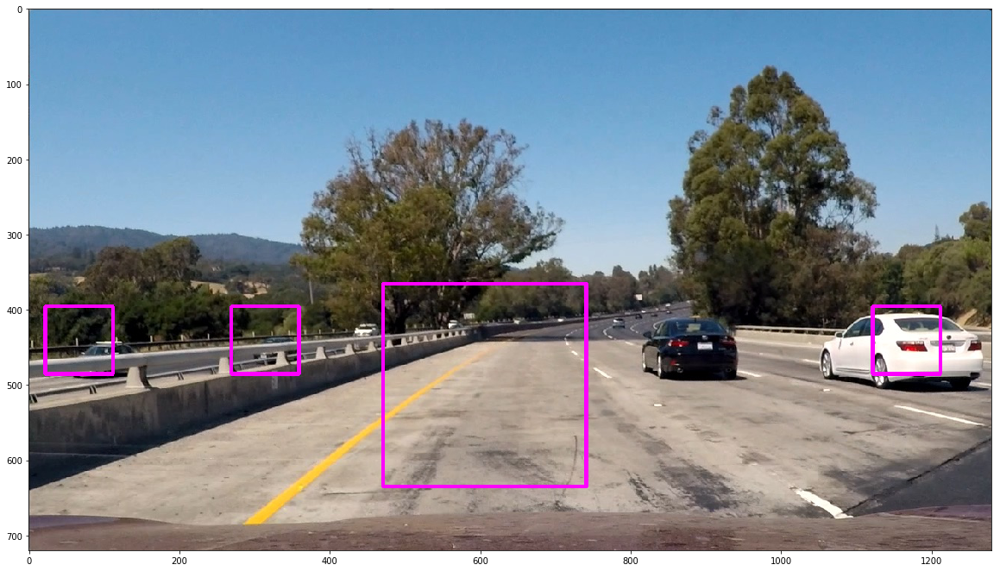

In [6]:
def annotate_test_image_verbose():
    path = 'test_images/test1.jpg'
    img_bgr = cv2.imread(path)
    img_rgb = np.array(img_bgr[:,:,::-1])
    
    for x0,x1,y0,y1 in select_windows(img_rgb, verbose=True):
        cv2.rectangle(img_rgb, (x0,y0), (x1,y1), (255,0,255), 3)
    
    plt.figure(figsize=(20, 20))
    plt.imshow(img_rgb)

annotate_test_image_verbose()

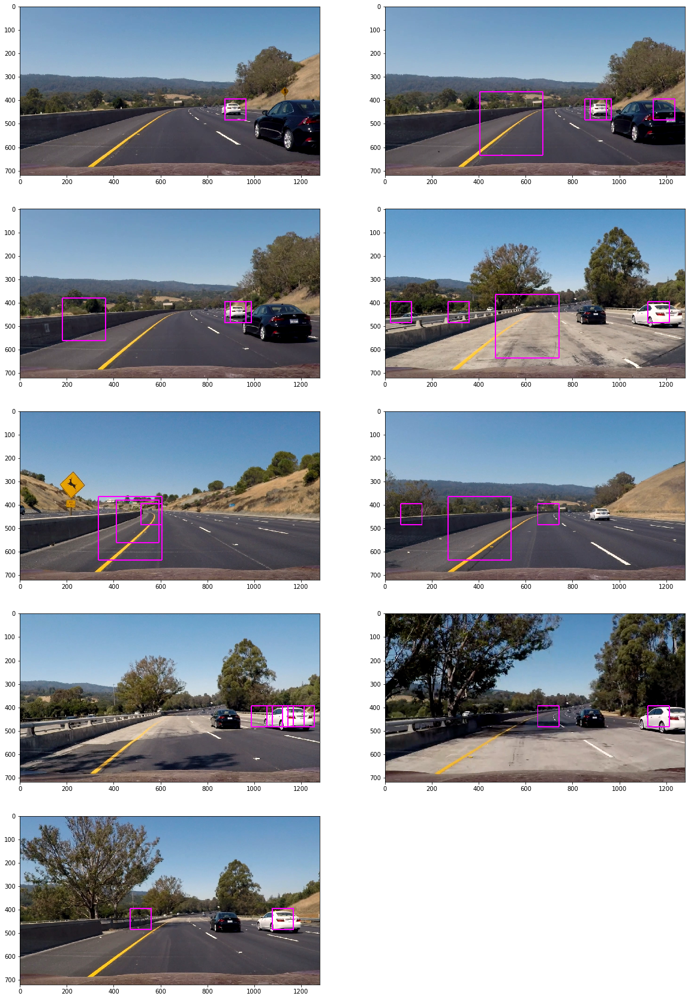

In [7]:
def annotate_test_images_quiet():
    img_paths = glob.glob('test_images/*')
    fig, axes = plt.subplots(ncols=2, nrows=math.ceil(len(img_paths) / 2), figsize=(20, 30))
    axes = axes.flatten()
    for ax in axes[len(img_paths):]:
        ax.remove()
    
    for img_path, ax in zip(img_paths, axes):
        img_bgr = cv2.imread(img_path)
        img_rgb = np.array(img_bgr[:,:,::-1])
        
        for x0,x1,y0,y1 in select_windows(img_rgb):
            cv2.rectangle(img_rgb, (x0,y0), (x1,y1), (255,0,255), 3)
        
        ax.imshow(img_rgb)

annotate_test_images_quiet()

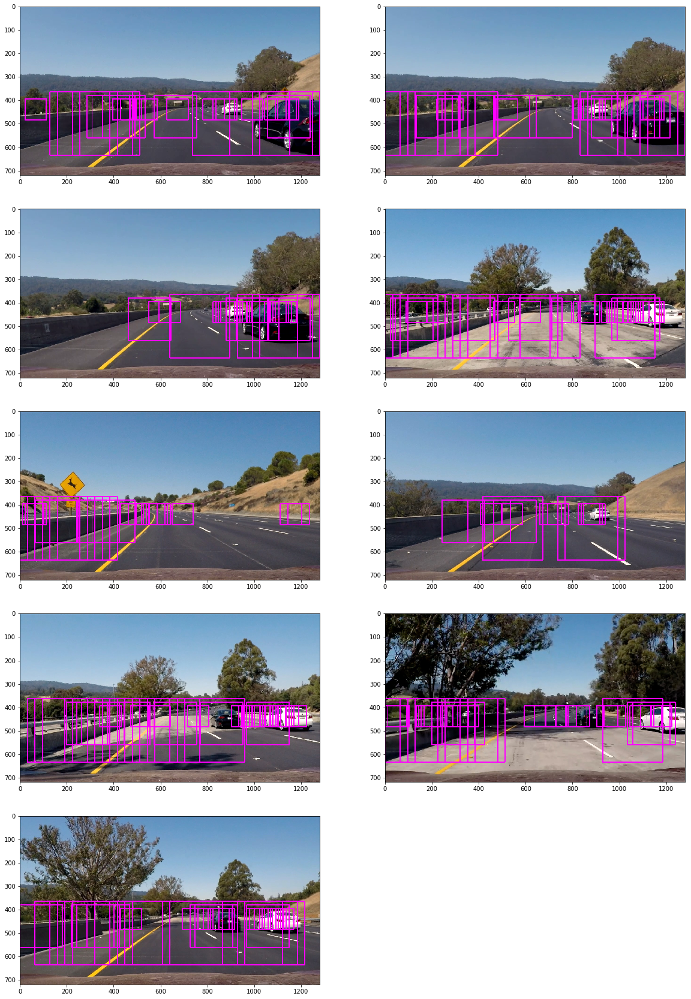

In [13]:
def search(img_rgb):
    cells_per_window = 8
    pixels_per_window = cells_per_window * TRAINING_RESULT['hog_config']['pixels_per_cell']
    
    hog_search_configs = get_hog_search_configs()
    
    for hog_y_center, hog_h in hog_search_configs:
        hog_top = int(hog_y_center - hog_h / 2)
        hog_btm = int(hog_y_center + hog_h / 2)
        
        # Force w to be a mult of 64, s.t. the right-most window touches the right edge.
        # This skews a bit horizontally, but it shouldn't matter too much.
        hog_input_w = round(img_rgb.shape[1] / (hog_btm - hog_top)) * pixels_per_window
        hog_input_img = cv2.resize(img_rgb[hog_top:hog_btm, :, :], (hog_input_w, pixels_per_window))
        
        hog = get_hog_features_from_image(hog_input_img, TRAINING_RESULT['hog_config'])
        
        num_blocks_per_window = hog.shape[0]
        num_windows = hog.shape[1] - num_blocks_per_window + 1
        num_cells_x = hog.shape[1] + hog.shape[3] - 1
        cell_w = int(img_rgb.shape[1] / num_cells_x)
        window_w = int(img_rgb.shape[1] / num_cells_x * cells_per_window)
        
        for block_ind_x in range(num_windows):
            window_hog_features = hog[:, block_ind_x : block_ind_x + num_blocks_per_window].flatten()
            
            classifier_features = TRAINING_RESULT['X_scaler'].transform([window_hog_features])
            
#             window_features = np.concatenate((
#                 hog[:, block_ind_x : block_ind_x + num_blocks_per_window].flatten(),
#                 hog_sch[:, block_ind_x : block_ind_x + num_blocks_per_window].flatten()
#             ))

            predicted = TRAINING_RESULT['clf'].predict(classifier_features)
            
            if predicted == 1:
                x0 = cell_w * block_ind_x
                x1 = x0 + window_w
                cv2.rectangle(img_rgb, (x0, hog_top), (x1, hog_btm), (255,0,255), 3)

# colors = color_spectrum(len(hog_constraints))

def search_test_images():
    img_paths = glob.glob('test_images/*')
    fig, axes = plt.subplots(ncols=2, nrows=math.ceil(len(img_paths) / 2), figsize=(20, 30))
    axes = axes.flatten()
    for ax in axes[len(img_paths):]:
        ax.remove()
    
    for img_path, ax in zip(img_paths, axes):
        img_bgr = cv2.imread(img_path)
        img_rgb = np.array(img_bgr[:,:,::-1])
        search(img_rgb)
        ax.imshow(img_rgb)

search_test_images()